This notebook is the report for the data challenge of BGDIA704.

# Introduction

# I. Try first

If it's easy, one should immediatly go for off-the-shelf solutions. Turns out it is easy nowadays with HuggingFace as we saw in our first data challenge.

Without any clue, let's just train a SOTA (state-of-the-art) DNN on our task and see how it goes.

Well 90% accuracy on the test set is pretty good ! Now to improve on that let's dive in on what we are really trying to achieve.

# II. Know your data

Let's have a look at the pictures we are dealing with.

In [1]:
from datasets import load_from_disk
import matplotlib.pyplot as plt
import os

/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
dataset_path = "../data/train/dataset.hf"
dataset = load_from_disk(dataset_path)
dataset = dataset.shuffle(seed=42)

Loading cached shuffled indices for dataset at /home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/data/train/dataset.hf/cache-18d0e488b1c3572b.arrow


In [3]:
# Get images and labels 
images = dataset['image']
labels = dataset['label']

In [4]:
images_0 = []
images_1 = []
for image, label in zip(images, labels):
    if label == 0:
        images_0.append(image)
    else:
        images_1.append(image)

In [5]:
save_directory = '../fig'

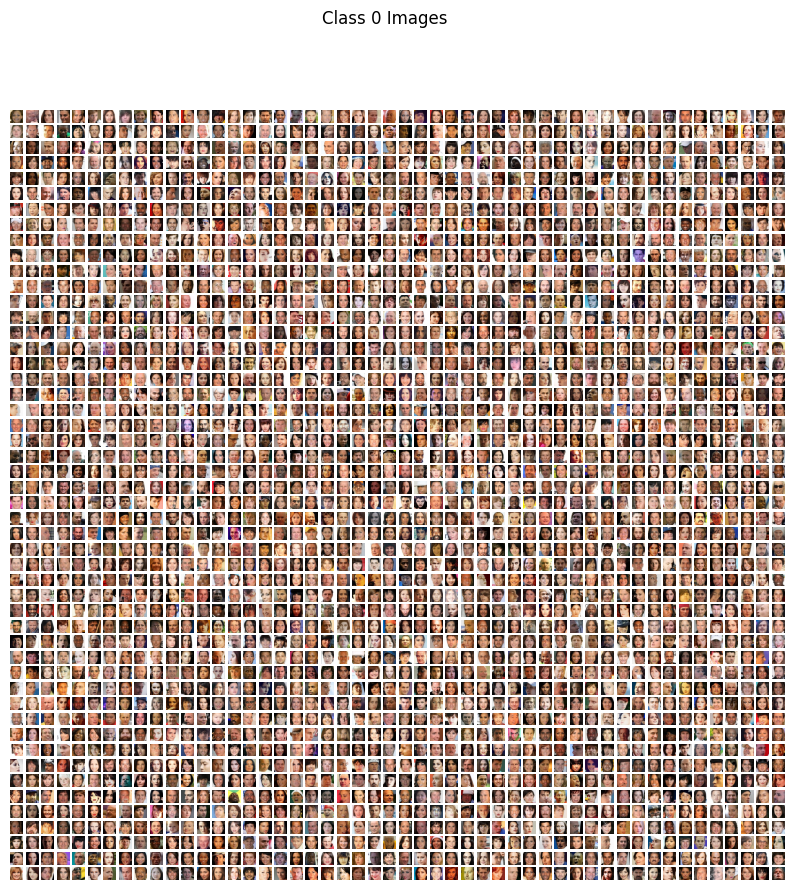

In [9]:
fig, axes = plt.subplots(50, 50, figsize=(10, 10))

# Plot class 0 images
for i, ax in enumerate(axes.flat):
    ax.imshow(images_0[i], cmap='gray')
    ax.axis('off')

plt.suptitle('Class 0 Images')

# Save the plot as an image file
plt.savefig(os.path.join(save_directory, 'class0_image_grid.png'))

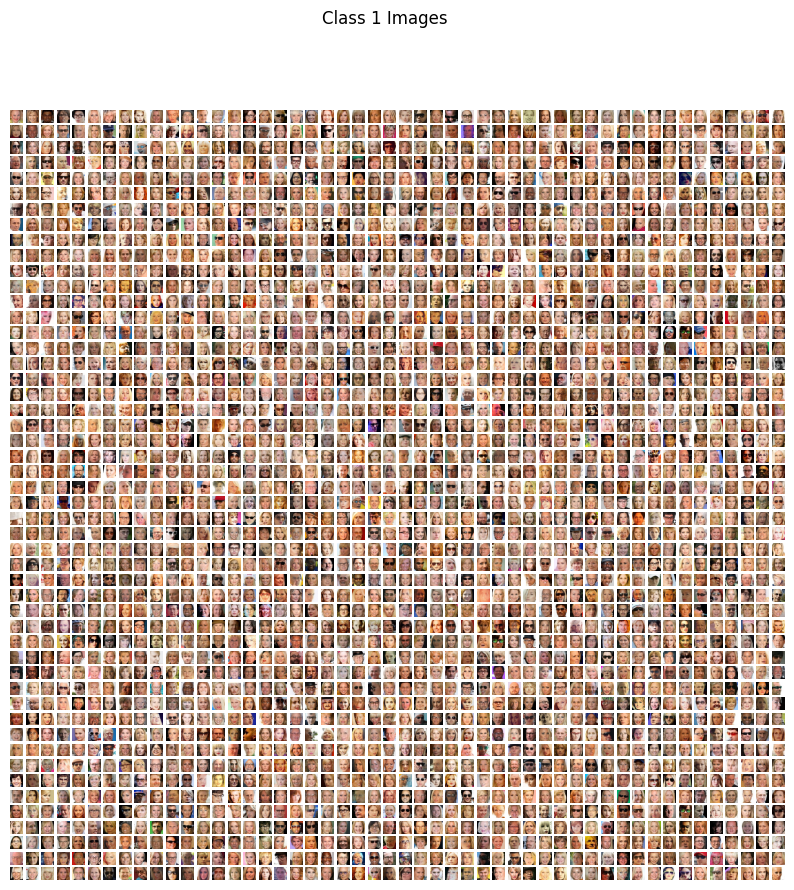

In [10]:
# Create a new figure for class 2 images
fig, axes = plt.subplots(50, 50, figsize=(10, 10))

# Plot class 1 images
for i, ax in enumerate(axes.flat):
    ax.imshow(images_1[i], cmap='gray')
    ax.axis('off')

plt.suptitle('Class 1 Images')

# Save the plot as an image file
plt.savefig(os.path.join(save_directory, 'class1_image_grid.png'))

I don't know about you but what I clearly see is that 0 are just people but 1 are either blond* or wearing glasses.

*female mainly but there is certainly a bias toward blond females, male do not dye their hair as often

# III. Know your model

## III.1 What does it see

All right, we have an idea of what we are looking for, but is our model agreeing with us ?
Our conclusion is very visual, we can attempt to use a XAI (explanable AI) visualisation technic to check wether our model agree with us or not.

In [8]:
from transformers import ViTForImageClassification, ViTFeatureExtractor
from torchvision.transforms import ToPILImage
from torch import from_numpy
from pytorch_grad_cam import run_dff_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from gradcam import category_name_to_index, reshape_transform_vit_huggingface

In [9]:
checkpoint = "../models/checkpoint-7221"
model = ViTForImageClassification.from_pretrained(
        checkpoint,
        num_labels=2,
    )
feature_extractor = ViTFeatureExtractor.from_pretrained(
        checkpoint
    )

/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum

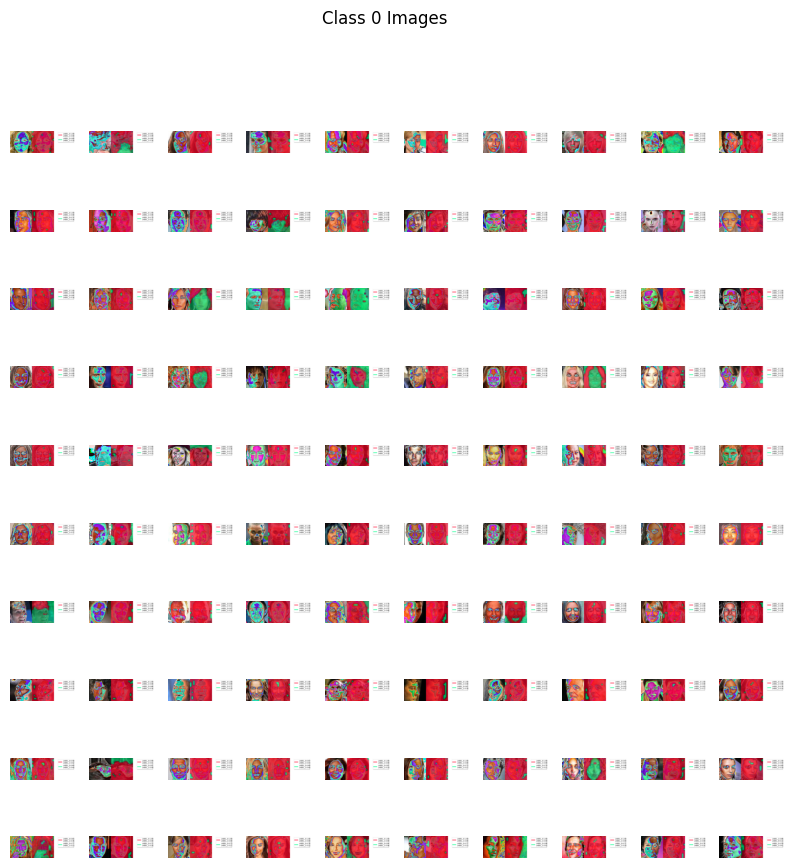

In [21]:
fig, axes = plt.subplots(10, 10, figsize=(10, 10))

to_pil = ToPILImage()

# Plot class 0 images
for i, ax in enumerate(axes.flat):

    # Prepare the image
    features = feature_extractor(images_0[i])
    img_tensor = from_numpy(features['pixel_values'][0])
    img_pil = to_pil(img_tensor)
    # Set the layer to prob
    target_layer_dff = model.vit.layernorm
    target_layer_gradcam = model.vit.encoder.layer[-2].output
    # Set targets
    targets_for_gradcam = [ClassifierOutputTarget(category_name_to_index(model, "LABEL_0")),
                       ClassifierOutputTarget(category_name_to_index(model, "LABEL_1"))]
    dff_image = run_dff_on_image(model=model,
                          target_layer=target_layer_dff,
                          classifier=model.classifier,
                          img_pil=img_pil,
                          img_tensor=img_tensor,
                          reshape_transform=reshape_transform_vit_huggingface,
                          n_components=2,
                          top_k=2)
    ax.imshow(dff_image, cmap='gray')
    ax.axis('off')

plt.suptitle('Class 0 Images')

# Save the plot as an image file
plt.savefig(os.path.join(save_directory, 'model_class0_image_grid.png'))

/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn(
/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/venv/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum

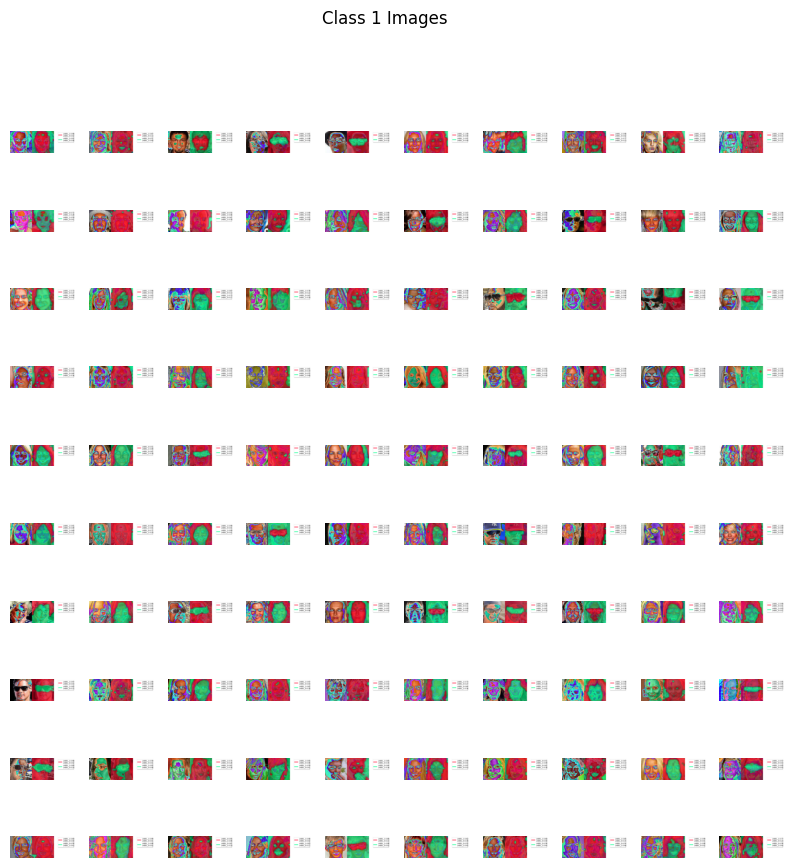

In [22]:
fig, axes = plt.subplots(10, 10, figsize=(10, 10))

to_pil = ToPILImage()

# Plot class 1 images
for i, ax in enumerate(axes.flat):

    # Prepare the image
    features = feature_extractor(images_1[i])
    img_tensor = from_numpy(features['pixel_values'][0])
    img_pil = to_pil(img_tensor)
    # Set the layer to prob
    target_layer_dff = model.vit.layernorm
    target_layer_gradcam = model.vit.encoder.layer[-2].output
    # Set targets
    targets_for_gradcam = [ClassifierOutputTarget(category_name_to_index(model, "LABEL_0")),
                       ClassifierOutputTarget(category_name_to_index(model, "LABEL_1"))]
    dff_image = run_dff_on_image(model=model,
                          target_layer=target_layer_dff,
                          classifier=model.classifier,
                          img_pil=img_pil,
                          img_tensor=img_tensor,
                          reshape_transform=reshape_transform_vit_huggingface,
                          n_components=2,
                          top_k=2)
    ax.imshow(dff_image, cmap='gray')
    ax.axis('off')

plt.suptitle('Class 1 Images')

# Save the plot as an image file
plt.savefig(os.path.join(save_directory, 'model_class1_image_grid.png'))

While it is far from perfect, there is definetly something going on with the glasses and the hair. And they are the main reasons to classify an image as label 1.

## III.2 Where does it fail ?

By splitting our train data between the bad predictions and the others, we can focus on what is fooling the algorithm. 

In [49]:
from transformers import pipeline
import matplotlib.pyplot as plt
import numpy as np

In [10]:
classifier = pipeline("image-classification", model=checkpoint)

In [16]:
len(images_1[:100])

100

In [34]:
results_1 = classifier(images_1[:100])

In [55]:
sample_errors_1 = [r[0]['label'] == 'LABEL_0' for r in results_1]
np.sum(sample_errors_1)

10

In [36]:
filtered_results_1 = [image for image, error in zip(images_1, sample_errors_1) if error]

In [42]:
def display_filtered_results(filtered_results):
    # Calculate the number of rows and columns needed for the grid
    num_images = len(filtered_results)
    num_rows = (num_images + 4) // 5  # Round up to the nearest integer
    num_cols = min(num_images, 5)

    # Create a figure and axes for the grid
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 2 * num_rows))

    # Iterate over the images and display them in the grid
    for i, image in enumerate(filtered_results):
        row = i // num_cols
        col = i % num_cols
        ax = axes[row, col]
        ax.imshow(image)
        ax.axis('off')

    # Remove any empty subplots
    for i in range(num_images, num_rows * num_cols):
        row = i // num_cols
        col = i % num_cols
        fig.delaxes(axes[row, col])

    # Adjust the spacing between subplots
    fig.tight_layout()

    # Display the grid of images
    plt.show()


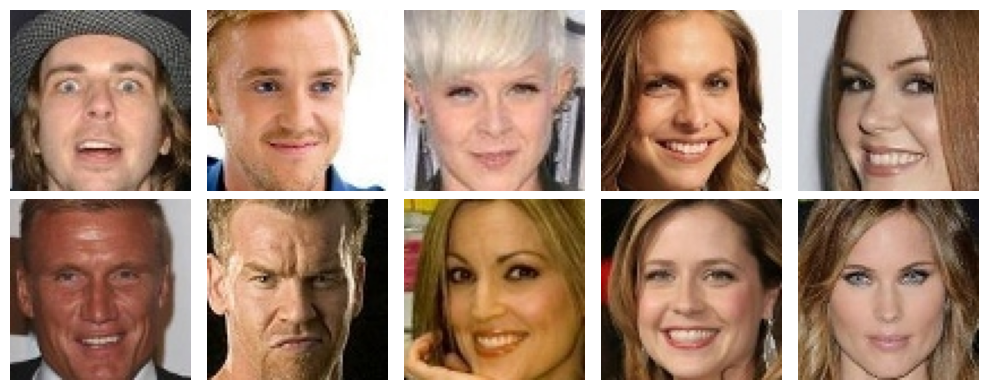

In [43]:
display_filtered_results(filtered_results_1)

More than half of those errors are people with short blond hair. The other errors are people with pretty dark hair.

In [52]:
results_0 = classifier(images_0[:500]) # need enough mistakes to display
sample_errors_0 = [r[0]['label'] == 'LABEL_1' for r in results_0]
np.sum(sample_errors_0)

10

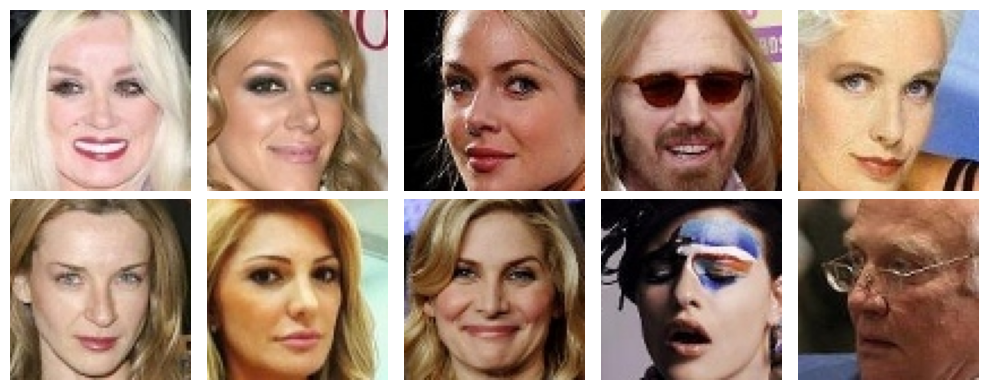

In [53]:
filtered_results_0 = [image for image, error in zip(images_0, sample_errors_0) if error]
display_filtered_results(filtered_results_0)

Apparently these images are 0 but were classified as 1 by the algorithm. Their could be meaning in this image but it's hard to say, they only represent 10 mistakes out of 500, 0.02%.
These images could be mislabeled. Focus should be better put on the other kind of mistake, 1's that are not recalled.

Let's check with a little more examples, we are rich on data.

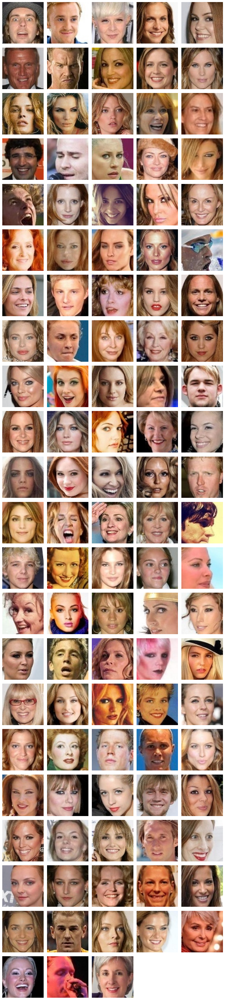

In [56]:
results = classifier(images_1[:1000]) # need enough mistakes to be somewhat significant
sample_errors = [r[0]['label'] == 'LABEL_0' for r in results]
filtered_results = [image for image, error in zip(images_1, sample_errors) if error]
display_filtered_results(filtered_results)

Ah we might consider fair hair in general (to include red hair), but not completely white hair either...
We have 100 wrong examples here out of a thousand, still 10% of errors.

Another important thing is how confident is the model in its errors. Hopefully there is a difference in the distribution.

# IV. Data augmentation

So there are funny augmentations we can do here. \
Instead of the traditionnal ones that might change the meaning of our pictures. \
We can simply, well, disguise them with wigs and glasses like undercover spies !

One other thing we might do is use the test data by forcing its class to 1. But that might be impractical if we add glasses to someone with glasses...

As for "classical" data augmentations, some could change the meaning of the image, so I must avoid too much color jittering, too much cropping. If not we might get light brown hair instead of blond, or see only the mouth and chin area and miss the glasses. 

## IV. 1. Hair

Even better, and easier to find, there are package to numerically dye hair.

In [70]:
import sys, importlib
importlib.reload(sys.modules['hairdye'])

<module 'hairdye' from '/home/users/jma-21/BGDIA704 - Machine learning avancé/DataChallenge/face-classification/faceclassif/hairdye.py'>

In [6]:
import cv2
import numpy as np
from skimage.filters import gaussian
from hairdye import evaluate, hair

In [7]:
table = {
    'hair': 17,
}

cp = '../models/checkpoint_hairdye/79999_iter.pth'

image = images_0[0]
ori = np.array(image.copy())
parsing = evaluate(image, cp)
parsing

array([[ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       ...,
       [17, 17, 17, ..., 17, 17, 17],
       [17, 17, 17, ..., 17, 17, 17],
       [17, 17, 17, ..., 17, 17, 17]])

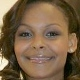

In [8]:
# reminder of the original
image

In [9]:
parsing = cv2.resize(parsing, image.size[0:2], interpolation=cv2.INTER_NEAREST)

colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]

for color in colors:
    image = hair(np.array(image), parsing, [table['hair']], color)

In [ ]:

cv2.imshow('image', cv2.resize(ori, (512, 512)))
cv2.imshow('color', cv2.resize(image, (512, 512)))

Unfortunately this is taking far too long (several minutes for one image !) to be usable in our code.

We need to find something else. How about simply considering the colors related to light hair color. And which are generally not in the background.

In [7]:
import numpy as np

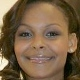

In [64]:
image_to_filter = images_0[0]
image_to_filter

In [67]:
# first let's remove most of the face

import cv2
import dlib
import numpy as np

# Load the detector
detector = dlib.get_frontal_face_detector()

# Load the predictor
predictor = dlib.shape_predictor("../models/shape_predictor_68_face_landmarks.dat")  # download and specify correct path here

# read the image
img = np.array(image_to_filter)  # replace with your image path

# convert to gray
gray = cv2.cvtColor(src=img, code=cv2.COLOR_RGB2GRAY)

# Use detector to find face landmarks
faces = detector(gray)

for face in faces:
    x1 = face.left()  # left point
    y1 = face.top()  # top point
    x2 = face.right()  # right point
    y2 = face.bottom()  # bottom point

    # Create rectangle around the face
    img = cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 0), -1)

cv2.imshow("image", img)


RuntimeError: Unable to open shape_predictor_68_face_landmarks.dat

In [65]:
from skimage.color import rgb2hsv

# Load your image as a numpy array
image_array = np.array(image_to_filter)

# Convert to HSV
hsv_img = rgb2hsv(image_array)

# Extract the hue channel
hue_img = hsv_img[:, :, 0]

# Create a mask for pixels in the desired hue range
hue_mask = (hue_img > 0.06) & (hue_img < 0.1)

# Apply the mask to the original image, setting pixels outside the mask to black
filtered_image = np.zeros_like(image_array)  # create an all-black image of the same size
filtered_image[hue_mask] = image_array[hue_mask]  # set the pixels inside the mask to their original values

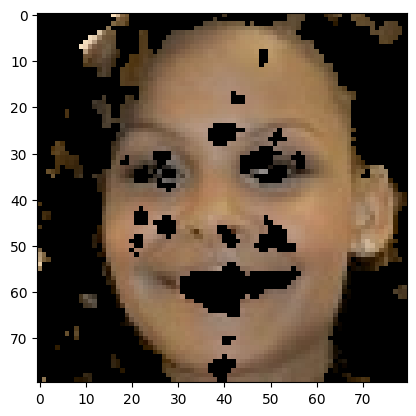

In [66]:
plt.imshow(filtered_image, cmap='hsv')


## IV. 2. Glasses

To add glasses to a face we could use some kind of VAE, GAN, diffusion but it would necessitate one pretrained, and more important it should be quick in order to be used during training.
A somewhat simpler and faster option is to overlay images of glasses over a face using equivalent to this one for masks : https://github.com/aqeelanwar/MaskTheFace/tree/master \
It works by detecting keypoints, determining face orientation and applying a deformed template of a mask.

In fact we don't even need to bother with that transformation in a first time, since our mistakes are mainly on blond people.

# V. Improve training

What's more we can go to anytype of 1 at will, it enables us to do something interesting.\
We can follow the performance curve on only our synthetic data, and add the real ones later on.\
And we can monitor the performances on some particular type of people. \

# VI. Conclusion 